In [1]:
import numpy as np  #utilizada para tratar vetores e matrizes
 
import pandas as pd  #utilizada para tratar dataframes
 
import matplotlib as mpl  #utilizada para tratar gráficos
import matplotlib.pyplot as plt
 
from sklearn import preprocessing  #utilizada para realizar o preprocessamento dos dados
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split # função utilizada para dividir do dataset entre treinamento e test
from sklearn.metrics import classification_report, confusion_matrix  #metrica de desempenho para o sklearn

In [2]:
# !pip install pandas-profiling
# !pip install --upgrade pandas-profiling

You should consider upgrading via the '/home/jlima/anaconda/envs/udacity-ai-env/bin/python -m pip install --upgrade pip' command.


You should consider upgrading via the '/home/jlima/anaconda/envs/udacity-ai-env/bin/python -m pip install --upgrade pip' command.


In [3]:
# Realiza o download do dataset a ser utilizado.
data = pd.read_csv("winequality-red.csv", sep=";")

In [4]:
data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [6]:
# No dataset utilizado para o desafio, quantas instâncias e atributos existem, respectivamente?
# Quantos tipos diferentes de dados existem no dataset do desafio?
data.shape

(1599, 12)

In [7]:
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [8]:
data.corr(method='pearson').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1) 

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.0,-0.26,0.67,0.11,0.094,-0.15,-0.11,0.67,-0.68,0.18,-0.062,0.12
volatile acidity,-0.26,1.0,-0.55,0.0019,0.061,-0.011,0.076,0.022,0.23,-0.26,-0.2,-0.39
citric acid,0.67,-0.55,1.0,0.14,0.2,-0.061,0.036,0.36,-0.54,0.31,0.11,0.23
residual sugar,0.11,0.0019,0.14,1.0,0.056,0.19,0.2,0.36,-0.086,0.0055,0.042,0.014
chlorides,0.094,0.061,0.2,0.056,1.0,0.0056,0.047,0.2,-0.27,0.37,-0.22,-0.13
free sulfur dioxide,-0.15,-0.011,-0.061,0.19,0.0056,1.0,0.67,-0.022,0.07,0.052,-0.069,-0.051
total sulfur dioxide,-0.11,0.076,0.036,0.2,0.047,0.67,1.0,0.071,-0.066,0.043,-0.21,-0.19
density,0.67,0.022,0.36,0.36,0.2,-0.022,0.071,1.0,-0.34,0.15,-0.5,-0.17
pH,-0.68,0.23,-0.54,-0.086,-0.27,0.07,-0.066,-0.34,1.0,-0.2,0.21,-0.058
sulphates,0.18,-0.26,0.31,0.0055,0.37,0.052,0.043,0.15,-0.2,1.0,0.094,0.25


<AxesSubplot:xlabel='fixed acidity', ylabel='pH'>

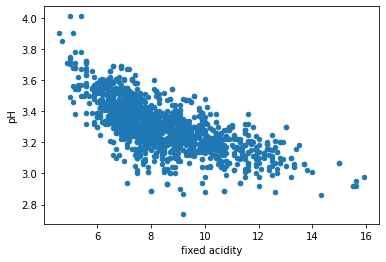

In [9]:
# Existe uma correlação negativa. Quanto maior o "fixed acidity, menor é o "pH".
data.plot.scatter(x='fixed acidity',y='pH',colormap='viridis') 

In [10]:
# descritivo dos dados
from pandas_profiling import ProfileReport

profile = ProfileReport(data, title="Startup Profit")

In [11]:
# visualização do relatório inicial
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:xlabel='quality', ylabel='alcohol'>

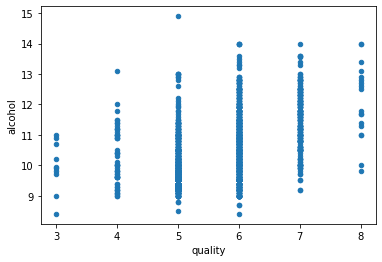

In [12]:
# Sobre o coeficiente de correlação de Pearson entre as variáveis "quality" e "alcohol", mesmo sendo reduzido, é CORRETO dizer:
# Não existe correlação
data.plot.scatter(x='quality',y='alcohol',colormap='viridis') 

In [13]:
# Quantas instâncias existem para a qualidade do vinho igual a 5?
data[data['quality'] == 5].shape

(681, 12)

In [14]:
data['quality'].unique()

array([5, 6, 7, 4, 8, 3])

In [15]:
# define min max scaler
scaler = MinMaxScaler()
entradas_normalizadas = pd.DataFrame(scaler.fit_transform(data.iloc[:,0:11]))
entradas_normalizadas.columns = list(data.iloc[:,0:11].columns)
entradas_normalizadas['quality'] = data['quality'] #coloca os valores bpara a saída (diagnóstico) no "novo" dataframe

In [16]:
entradas_normalizadas.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [17]:
entradas_normalizadas.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,5
1,0.283186,0.520548,0.00,0.116438,0.143573,0.338028,0.215548,0.494126,0.362205,0.209581,0.215385,5
2,0.283186,0.438356,0.04,0.095890,0.133556,0.197183,0.169611,0.508811,0.409449,0.191617,0.215385,5
3,0.584071,0.109589,0.56,0.068493,0.105175,0.225352,0.190813,0.582232,0.330709,0.149701,0.215385,6
4,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,5


In [18]:
entradas_normalizadas.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,0.329171,0.279329,0.270976,0.112247,0.125988,0.209506,0.142996,0.490211,0.449695,0.196496,0.311228,5.636023
std,0.154079,0.122644,0.194801,0.096570,0.078573,0.147326,0.116238,0.138571,0.121564,0.101501,0.163949,0.807569
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
25%,0.221239,0.184932,0.090000,0.068493,0.096828,0.084507,0.056537,0.406021,0.370079,0.131737,0.169231,5.000000
50%,0.292035,0.273973,0.260000,0.089041,0.111853,0.183099,0.113074,0.490455,0.448819,0.173653,0.276923,6.000000
75%,0.407080,0.356164,0.420000,0.116438,0.130217,0.281690,0.197880,0.570117,0.519685,0.239521,0.415385,6.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,8.000000


In [19]:
# Após dividir o dataset utilizando o método train_test_split(entradas_normalizadas, saida, test_size=0.30, random_state=1). Qual foi a acurácia para o KNN?
data_in = data.drop('quality',axis=1)  # seleciona os valores para serem utilizados como entrada do dataframe
X = data_in.values  # cria o vetor de entrada 

#divide o conjunto de dados entre treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, entradas_normalizadas['quality'], test_size=0.3, random_state=1)

In [20]:
#aplicando o kNN
from sklearn import neighbors
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

In [21]:
classifier = KNeighborsClassifier(n_neighbors=5) #utiliza a construção por meio de 5 vizinhos
classifier.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [22]:
#realiza a previsão
y_pred = classifier.predict(X_test)

In [23]:
# !pip install mlxtend

<ipython-input-24-9485f6952fc2>:7: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()
/home/jlima/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.20      0.05      0.08        21
           5       0.55      0.68      0.61       207
           6       0.48      0.43      0.46       195
           7       0.37      0.33      0.35        52
           8       0.00      0.00      0.00         3

    accuracy                           0.50       480
   macro avg       0.27      0.25      0.25       480
weighted avg       0.48      0.50      0.49       480



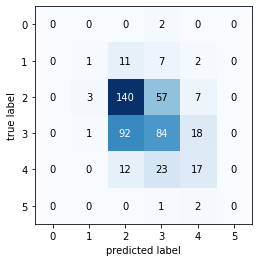

In [24]:
#constroi a matriz de confusão para comparar o modelo criado
from sklearn.metrics import classification_report, confusion_matrix
from mlxtend.plotting import plot_confusion_matrix

mtx_confusion_knn = confusion_matrix(y_test, y_pred)
fig, ax = plot_confusion_matrix(conf_mat = mtx_confusion_knn)
plt.show()

print(classification_report(y_test, y_pred))

In [25]:
# Aplicando o algoritmo de árvore de decisão com os parâmetros definidos no enunciado do 
# desafio e a divisão de treinamento e teste, como mostrado anteriormente, qual é o valor da acurácia?
from sklearn.tree import DecisionTreeClassifier

In [26]:
classifier_tree = DecisionTreeClassifier()
classifier_tree.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [27]:
y_pred_tree = classifier_tree.predict(X_test)

In [28]:
print(confusion_matrix(y_test, y_pred_tree))
print(classification_report(y_test, y_pred_tree))

[[  0   0   0   2   0   0]
 [  1   2  10   5   3   0]
 [  1   7 142  45  12   0]
 [  1   3  62 110  19   0]
 [  0   0   4  15  31   2]
 [  0   0   0   0   2   1]]
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.17      0.10      0.12        21
           5       0.65      0.69      0.67       207
           6       0.62      0.56      0.59       195
           7       0.46      0.60      0.52        52
           8       0.33      0.33      0.33         3

    accuracy                           0.60       480
   macro avg       0.37      0.38      0.37       480
weighted avg       0.59      0.60      0.59       480



In [29]:
# !pip install pydotplus

In [30]:
# Visualizando a arvore de decisão
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO
from IPython.display import Image
import pydotplus

/home/jlima/.local/lib/python3.8/site-packages/sklearn/externals/six.py:28: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  warnings.warn("The module is deprecated in version 0.21 and will be removed "


In [31]:
entradas_normalizadas.iloc[:,0:11].columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol'],
      dtype='object')

In [32]:
dot_data = StringIO()
export_graphviz(classifier_tree, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names = entradas_normalizadas.iloc[:,0:11].columns, 
                class_names = ['5', '6', '7', '4', '8', '3'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('wine.png')
Image(graph.create_png())

In [33]:
# Aplicando o algoritmo de floresta randômica com os mesmos parâmetros apresentados no 
# enunciado e mesmos valores para o treinamento e teste, qual é o valor mais próximo para a acurácia?
from sklearn.ensemble import RandomForestClassifier

In [34]:
classifier_forest = RandomForestClassifier(max_depth=10, random_state=1)
classifier_forest.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=1, verbose=0,
                       warm_start=False)

In [35]:
y_pred_forest = classifier_forest.predict(X_test)

In [36]:
print(confusion_matrix(y_test, y_pred_forest))
print(classification_report(y_test, y_pred_forest))

[[  0   0   2   0   0   0]
 [  0   0  14   7   0   0]
 [  0   0 167  38   2   0]
 [  0   0  44 138  13   0]
 [  0   0   5  25  22   0]
 [  0   0   0   1   2   0]]
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.00      0.00      0.00        21
           5       0.72      0.81      0.76       207
           6       0.66      0.71      0.68       195
           7       0.56      0.42      0.48        52
           8       0.00      0.00      0.00         3

    accuracy                           0.68       480
   macro avg       0.32      0.32      0.32       480
weighted avg       0.64      0.68      0.66       480



/home/jlima/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [37]:
# Aplicando o algoritmo SVM para a classificação da qualidade dos vinhos com os mesmos valores anteriores
# para treinamento e teste, qual é o valor mais próximo para a acurácia obtido?
from sklearn.svm import SVC
classifier_svm = SVC(gamma='auto',kernel='rbf')

In [38]:
# Realiza a classificação via SVM
classifier_svm.fit(X_train, y_train)

# Realiza a previsão de classificação com o conjunto de testes
y_pred_svm = classifier_svm.predict(X_test)

<ipython-input-39-71cfd03c80ae>:4: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()
/home/jlima/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.00      0.00      0.00        21
           5       0.58      0.76      0.66       207
           6       0.54      0.52      0.53       195
           7       0.57      0.25      0.35        52
           8       0.00      0.00      0.00         3

    accuracy                           0.56       480
   macro avg       0.28      0.25      0.26       480
weighted avg       0.53      0.56      0.54       480



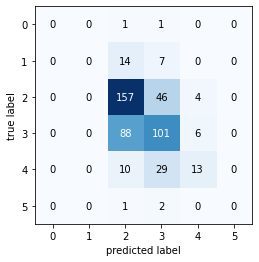

In [39]:
# avaliando o modelo
mtx_confusion_svm = confusion_matrix(y_test, y_pred_svm)
fig, ax = plot_confusion_matrix(conf_mat = mtx_confusion_svm)
plt.show()

print(classification_report(y_test, y_pred_svm))

In [40]:
# Aplicando a rede MLP, como mostrado no enunciado, e com os mesmos dados de treinamento 
# e teste utilizados, qual é o valor mais próximo para a acurácia do modelo?
from sklearn.neural_network import MLPClassifier

# Configurando a rede
classifier_mlp = MLPClassifier(alpha = 1e-5, hidden_layer_sizes = (5, 5), random_state = 1)

In [41]:
# Realiza o fit do modelo
classifier_mlp.fit(X_train, y_train)

# Realiza previsoes na base de teste
y_pred_mlp = classifier_mlp.predict(X_test)

/home/jlima/.local/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:568: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


<ipython-input-42-f081dceec21c>:4: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()
/home/jlima/.local/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.00      0.00      0.00        21
           5       0.58      0.50      0.54       207
           6       0.44      0.66      0.53       195
           7       0.14      0.02      0.03        52
           8       0.00      0.00      0.00         3

    accuracy                           0.49       480
   macro avg       0.19      0.20      0.18       480
weighted avg       0.44      0.49      0.45       480



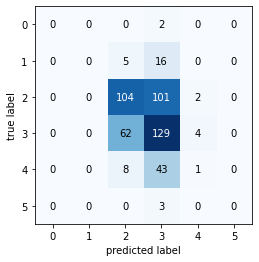

In [42]:
# avaliando o modelo
mtx_confusion_mlp = confusion_matrix(y_test, y_pred_mlp)
fig, ax = plot_confusion_matrix(conf_mat = mtx_confusion_mlp)
plt.show()

print(classification_report(y_test, y_pred_mlp))

In [43]:
# Modifique o dataset para um sistema binário que considere vinhos com nota maior do que 5 (6, 7, 8) 
# sejam bons e menores ou igual a 5 ruins (5, 4, 3). Aplique o modelo da floresta randômica. 
# Qual é o valor mais próximo da acurácia do modelo para esse novo dataset?
new_data = pd.read_csv("winequality-red.csv", sep=";")
new_data['quality'].unique()

array([5, 6, 7, 4, 8, 3])

In [44]:
new_data['quality'] = new_data['quality'].map({3: 0, 4: 0, 5: 0, 6: 1, 7: 1, 8: 1})

In [45]:
new_data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,1
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0


In [46]:
# define min max scaler
scaler = MinMaxScaler()
data_n2 = pd.DataFrame(scaler.fit_transform(new_data.iloc[:,0:11]))
data_n2.columns = list(new_data.iloc[:,0:11].columns)
data_n2['quality'] = new_data['quality'] #coloca os valores bpara a saída (quality) no "novo" dataframe normalizado

In [47]:
data_n2.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0
1,0.283186,0.520548,0.00,0.116438,0.143573,0.338028,0.215548,0.494126,0.362205,0.209581,0.215385,0
2,0.283186,0.438356,0.04,0.095890,0.133556,0.197183,0.169611,0.508811,0.409449,0.191617,0.215385,0
3,0.584071,0.109589,0.56,0.068493,0.105175,0.225352,0.190813,0.582232,0.330709,0.149701,0.215385,1
4,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0


In [48]:
#divide o conjunto de dados entre treinamento e teste
data_in_2 = data_n2.drop('quality',axis=1)  # seleciona os valores para serem utilizados como entrada do dataframe
X = data_in_2.values  # cria o vetor de entrada 
X_train, X_test, y_train, y_test = train_test_split(X, data_n2['quality'], test_size=0.3, random_state=1)

In [49]:
# Realiza o fit do modelo
classifier_forest_binary = RandomForestClassifier(max_depth=10, random_state=1)
classifier_forest_binary.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=1, verbose=0,
                       warm_start=False)

In [50]:
# Realiza previsões com a base de teste no modelo criado
y_pred_forest_binary = classifier_forest_binary.predict(X_test)

              precision    recall  f1-score   support

           0       0.79      0.81      0.80       230
           1       0.82      0.80      0.81       250

    accuracy                           0.80       480
   macro avg       0.80      0.80      0.80       480
weighted avg       0.80      0.80      0.80       480



<ipython-input-51-c0f51ba5399d>:4: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


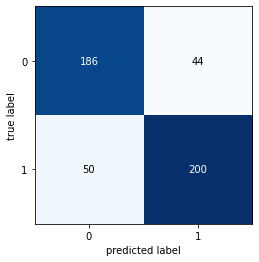

In [51]:
# avaliando o modelo
mtx_confusion_forest_binary = confusion_matrix(y_test, y_pred_forest_binary)
fig, ax = plot_confusion_matrix(conf_mat = mtx_confusion_forest_binary)
plt.show()

print(classification_report(y_test, y_pred_forest_binary))